In [1]:
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras import models
from tensorflow.keras import metrics


from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint,CSVLogger,ReduceLROnPlateau

import segmentation_models as sm
#from segmentation_models import get_preprocessing

import albumentations as A


import cv2
import os, shutil, pathlib, errno
import random as rd
import numpy as np
import matplotlib.pyplot as plt


import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

sm.set_framework('tf.keras')
sm.framework()

Segmentation Models: using `keras` framework.


'tf.keras'

In [2]:
print("NUM GPU AVALIABLE",len(tf.config.experimental.list_physical_devices('GPU')))

NUM GPU AVALIABLE 1


## **Dataloader**

In [3]:
# classes for data loading and preprocessing
class Dataset:
    """Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
                                                (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
                                                (e.g. noralization, shape manipulation, etc.)
    
    """

    CLASSES = ['palmera','sky', 'building', 'pole', 'road', 'pavement', 
               'tree', 'signsymbol', 'fence', 'car', 
               'pedestrian', 'bicyclist', 'unlabelled']
   
    def __init__(self,
                 images_dir,
                 masks_dir,
                 classes=None,
                 augmentation=None,
                 preprocessing=None,
        
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps  = [os.path.join(masks_dir, image_id)  for image_id in self.ids]
                
        
        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image=cv2.resize(image, (480,480), interpolation= cv2.INTER_LINEAR)
        mask = cv2.imread(self.masks_fps[i], 0)
        mask=cv2.resize(mask, (480,480), interpolation= cv2.INTER_LINEAR)

        
        
        
        
        #COLOR_BGR2RGB
        r,g,b = cv2.split(image)
        image = cv2.merge((r,g,b))
    
    
        
        # extract certain classes from mask
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')
        
        # add background if mask is not binary
        if mask.shape[-1] != 1:
            background = 1 - mask.sum(axis=-1, keepdims=True)
            mask = np.concatenate((mask, background), axis=-1)
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.ids)
    
    
class Dataloder(keras.utils.Sequence):
    """Load data from dataset and form batches
    
    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """
    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        
        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return batch
    
    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)   

## **Utility functions**

In [4]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)#, cmap='binary')
    plt.show()

# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

# define heavy augmentations
def get_training_augmentation():
    train_transform = [

        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),

        A.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),

        A.PadIfNeeded(min_height=456, min_width=456, always_apply=True, border_mode=0),
        A.RandomCrop(height=456, width=456, always_apply=True),

        A.GaussNoise(p=0.2),
        A.Perspective(p=0.5),

        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightnessContrast(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.Sharpen(p=1),
                A.Blur(blur_limit=3, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomBrightnessContrast(p=1),
                A.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
        A.Lambda(mask=round_clip_0_1)
    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.PadIfNeeded(456, 456)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

## **Loading dataset**

In [5]:
DATA_DIR = './palmeras/SegmentationDataset/'

x_train_dir = os.path.join(DATA_DIR, 'train/jpegs')
y_train_dir = os.path.join(DATA_DIR, 'train/masksH')

x_valid_dir = os.path.join(DATA_DIR, 'validation/jpegs')
y_valid_dir = os.path.join(DATA_DIR, 'validation/masksH')

x_test_dir = os.path.join(DATA_DIR, 'test/jpegs')
y_test_dir = os.path.join(DATA_DIR, 'test/masksH')


./palmeras/SegmentationDataset/test/jpegs


(480, 480, 1)


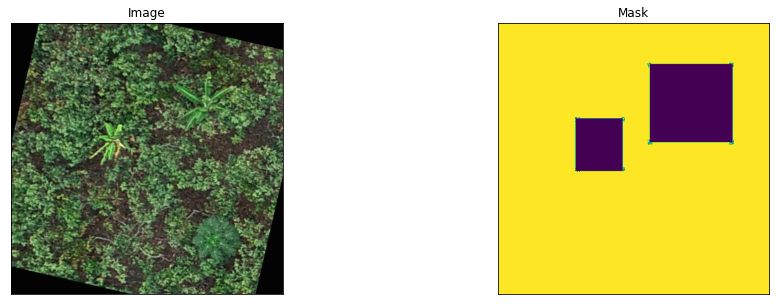

(480, 480, 1)


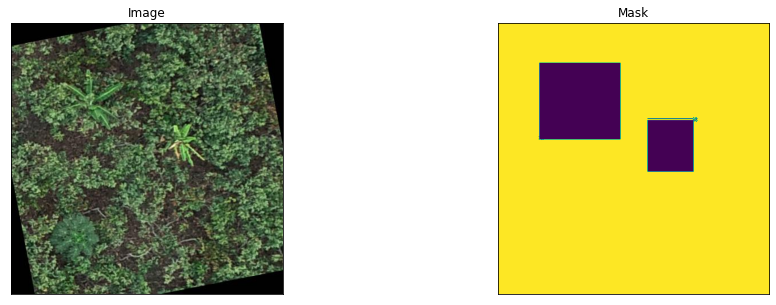

(480, 480, 1)


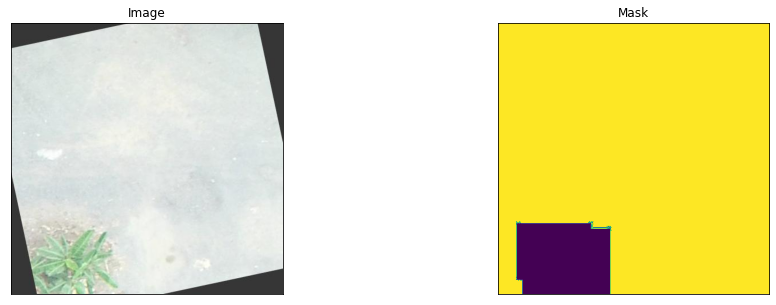

In [6]:
# Testing the get_training_augmentation
for i in range(3):
    dataset = Dataset(x_train_dir, y_train_dir, classes=['palmera'])#, augmentation=get_training_augmentation())
    
    image, mask = dataset[i]
    print(mask.shape)
    visualize(image=image,
              mask=mask.squeeze(),
             )

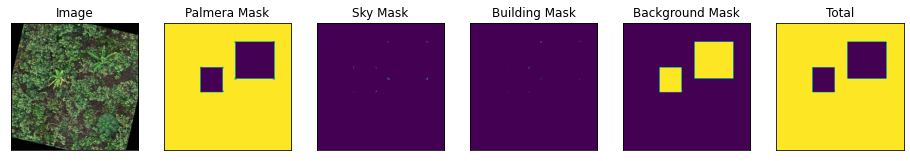

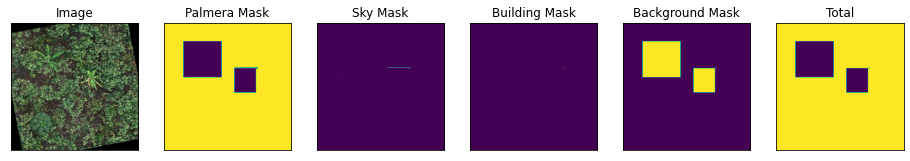

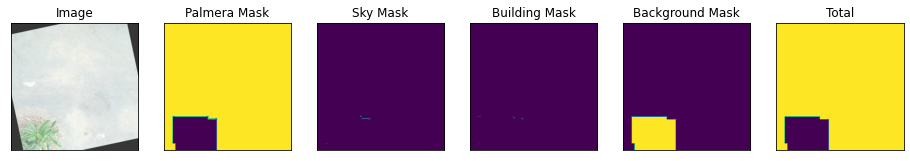

In [7]:
# Testing the get_training_augmentation
for i in range(3):
    dataset = Dataset(x_train_dir, y_train_dir, classes=['palmera','sky','building'])#, augmentation=get_training_augmentation())
    
    image, mask = dataset[i]
    visualize(image=image,
              palmera_mask=mask[..., 0].squeeze(),
              sky_mask=mask[..., 1].squeeze(),
              building_mask=mask[..., 2].squeeze(),
              background_mask=mask[..., 3].squeeze(),
              Total=mask[..., :-1].sum(axis=2).squeeze(),
             )

## **Model**

In [6]:
# Define preprocessor
BACKBONE = 'resnet18' #'resnet18' inceptionv3  resnet50
preprocess_input = sm.get_preprocessing(BACKBONE)

# Define classes
CLASSES=['palmera']

train_dataset = Dataset(x_train_dir,
                        y_train_dir,
                        classes= CLASSES,
                        preprocessing=get_preprocessing(preprocess_input),
                       )
valid_dataset = Dataset(x_valid_dir,
                        y_valid_dir,
                        classes= CLASSES,
                        preprocessing=get_preprocessing(preprocess_input),
                       )
batch_size=8

train_dataloader = Dataloder(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)


In [9]:
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

model = sm.Unet(BACKBONE, encoder_weights='imagenet', classes=n_classes, activation=activation, encoder_freeze=True)
#model.summary()

In [10]:
model.compile(optimizer=keras.optimizers.RMSprop(), #learning_rate=0.001,
              loss=sm.losses.JaccardLoss(), #'jaccard_loss'
              metrics= ["accuracy"] #metrics.BinaryAccuracy()   m.metrics.IOUScore()
             ) 

In [11]:
print(train_dataloader[0][0].shape)

(8, 480, 480, 3)


In [12]:
# train model
checkpoint= ModelCheckpoint('palmeras_model.keras',
                            save_freq='epoch',
                            save_weights_only=True,
                            save_best_only=True,
                            #mode='min'
                           )
csv_logger = CSVLogger('palmeras_model.log', separator=",", append=False)
reduceLR= ReduceLROnPlateau()


epochs=20
history = model.fit(train_dataloader,
                    steps_per_epoch=len(train_dataloader),
                    epochs=epochs,
                    validation_data=valid_dataloader,
                    validation_steps=len(valid_dataloader),
                    #verbose=False
                   )


Epoch 1/20
70/70 [==============================] - 39s 425ms/step - loss: 0.4110 - accuracy: 0.7466 - val_loss: 0.7596 - val_accuracy: 0.6546
Epoch 2/20
70/70 [==============================] - 28s 406ms/step - loss: 0.3374 - accuracy: 0.8036 - val_loss: 0.4641 - val_accuracy: 0.8762
Epoch 3/20
70/70 [==============================] - 28s 403ms/step - loss: 0.2998 - accuracy: 0.8417 - val_loss: 0.4228 - val_accuracy: 0.8751
Epoch 4/20
70/70 [==============================] - 28s 403ms/step - loss: 0.2784 - accuracy: 0.8648 - val_loss: 0.4448 - val_accuracy: 0.8773
Epoch 5/20
70/70 [==============================] - 28s 402ms/step - loss: 0.2538 - accuracy: 0.8873 - val_loss: 0.4463 - val_accuracy: 0.8742
Epoch 6/20
70/70 [==============================] - 28s 404ms/step - loss: 0.2342 - accuracy: 0.9036 - val_loss: 0.4552 - val_accuracy: 0.8613
Epoch 7/20
70/70 [==============================] - 29s 408ms/step - loss: 0.2233 - accuracy: 0.9090 - val_loss: 0.3997 - val_accuracy: 0.8811

In [13]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [14]:
loss=history.history['loss']
val_loss=history.history['val_loss']
accuracy=history.history['accuracy']
val_accuracy=history.history['val_accuracy']
epochs=range(1,len(loss)+1)

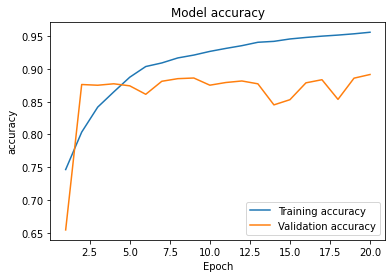

In [15]:
# Plot training & validation iou_score values
#plt.figure(figsize=(30, 5))
plt.plot(epochs,accuracy,label="Training accuracy")
plt.plot(epochs ,val_accuracy,label="Validation accuracy")
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

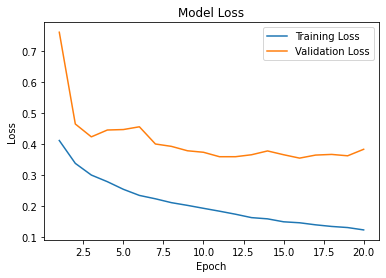

In [16]:
# Plot training & validation iou_score values
#plt.figure(figsize=(30, 5))
plt.plot(epochs,loss,label="Training Loss")
plt.plot(epochs ,val_loss,label="Validation Loss")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [15]:
model.compile(optimizer=keras.optimizers.RMSprop(), #learning_rate=0.001,
              loss=sm.losses.JaccardLoss(), #'jaccard_loss'
              metrics= ["accuracy"] #metrics.BinaryAccuracy()   m.metrics.IOUScore()
             ) 

In [9]:
model=keras.models.load_model('TESIS.h5',custom_objects={"jaccard_loss":sm.losses.JaccardLoss()}, compile=True)

In [9]:
CLASSES=['palmera']

## **Model Evaluation**

In [7]:
test_dataset = Dataset(x_test_dir,
                       y_test_dir,
                       classes= CLASSES,
                       #augmentation=get_training_augmentation(),
                       preprocessing=get_preprocessing(preprocess_input),
                      )
test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

# load best weights
#model.load_weights('palmeras_model.keras') 

In [10]:
scores = model.evaluate(test_dataloader)
print("Loss: {:.5}".format(scores[0]))
print("Accuracy: {:.5}".format(scores[1]))

50/50 [==============================] - 11s 21ms/step - loss: 0.4446 - accuracy: 0.8724
Loss: 0.44458
Accuracy: 0.87243


In [19]:
#model=keras.models.load_model('TESIS.h5', compile=False)

## **Results**

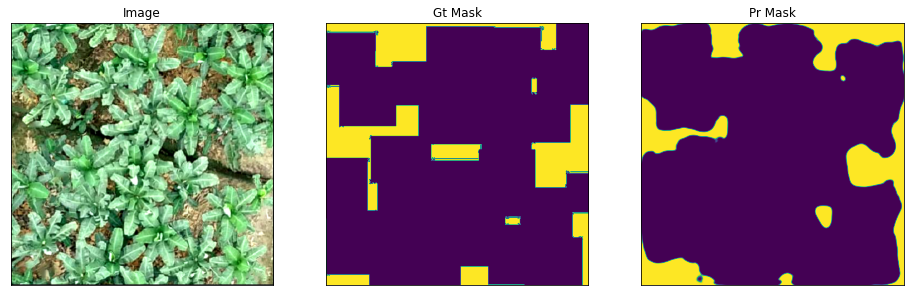

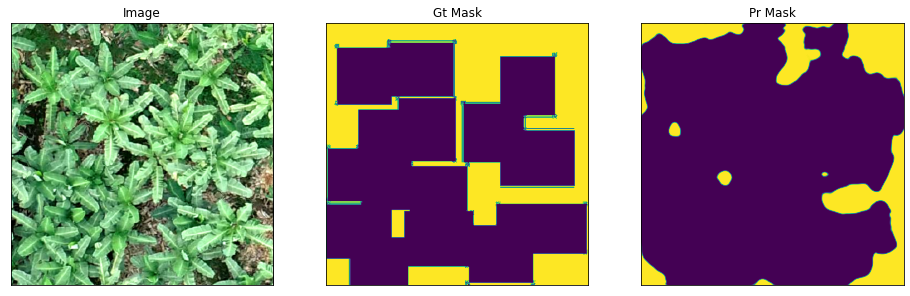

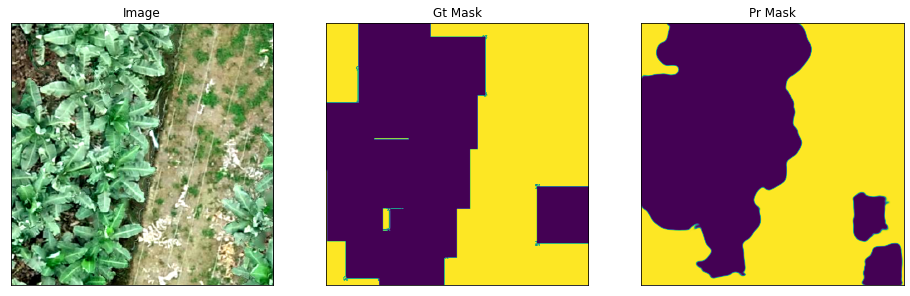

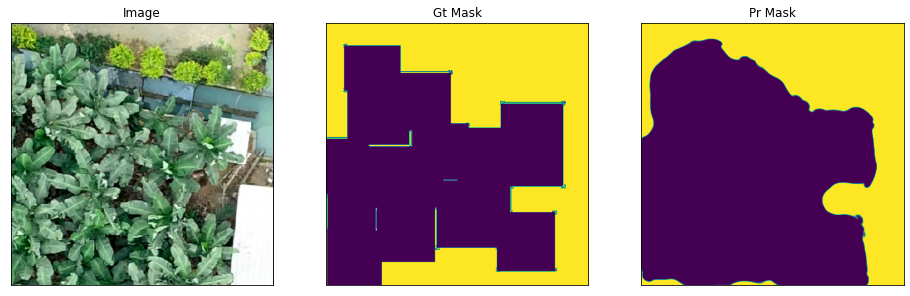

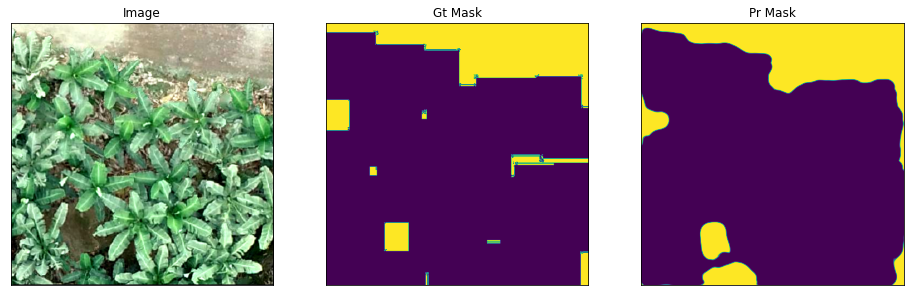

...

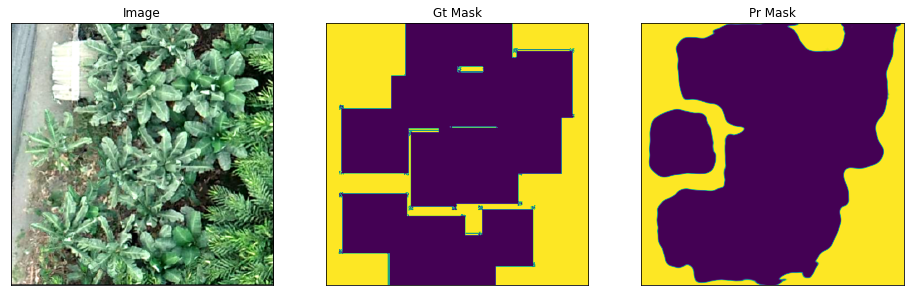

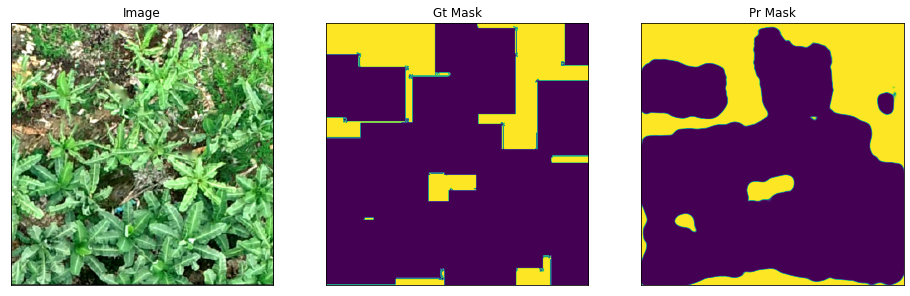

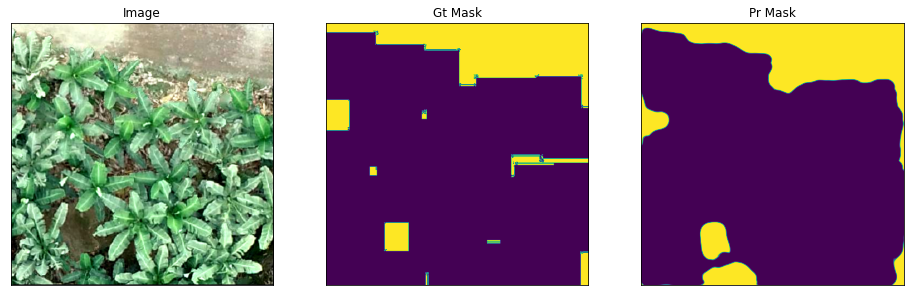

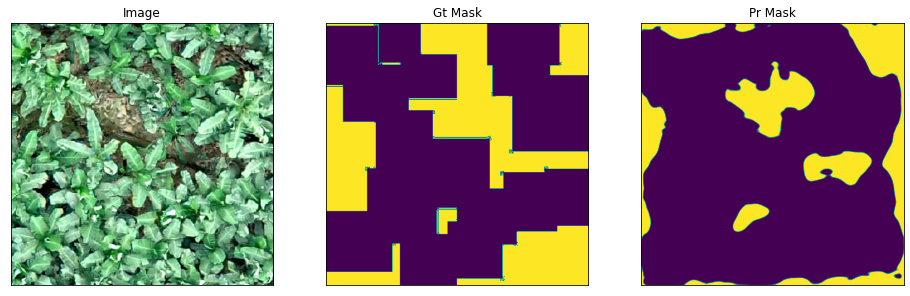

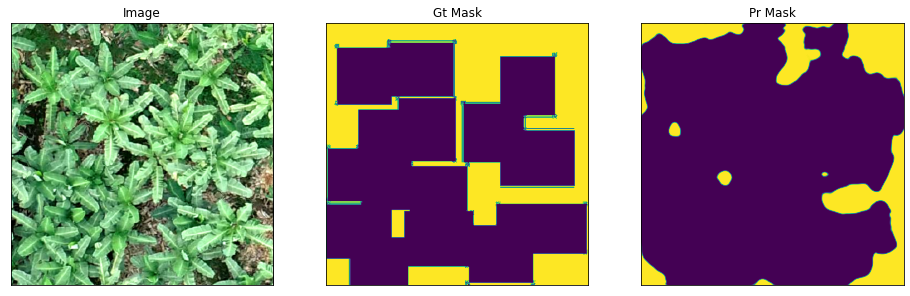

In [29]:
n = len(test_dataset)
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:
    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image)
  
    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

In [21]:
model.save('TESIS.h5')

c:\users\ricardo.desktop-rdmsjea\appdata\local\programs\python\python39\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
